In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
import cufflinks as cf
import plotly.express as px
import chart_studio as py
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
from sklearn.model_selection import train_test_split
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import matplotlib
from urllib.request import urlopen
import json
import plotly.io as pio
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR, LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
%matplotlib inline
init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")
pio.renderers.default = 'iframe'
cf.go_offline()
sns.set_style("dark")
sns.set_palette("plasma")

In [2]:
dataframe = pd.read_csv("House_Rent_Dataset.csv")

In [3]:
dataframe.head()

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact
0,2022-05-18,2,10000,1100,Ground out of 2,Super Area,Bandel,Kolkata,Unfurnished,Bachelors/Family,2,Contact Owner
1,2022-05-13,2,20000,800,1 out of 3,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
2,2022-05-16,2,17000,1000,1 out of 3,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
3,2022-07-04,2,10000,800,1 out of 2,Super Area,Dumdum Park,Kolkata,Unfurnished,Bachelors/Family,1,Contact Owner
4,2022-05-09,2,7500,850,1 out of 2,Carpet Area,South Dum Dum,Kolkata,Unfurnished,Bachelors,1,Contact Owner


In [4]:
train_dataframe, test_dataframe = train_test_split(dataframe, test_size = 0.2, random_state = 42, shuffle = True)

In [5]:
train_dataframe.head(5)

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact
1995,2022-05-10,2,23500,950,6 out of 8,Super Area,Bilekahalli,Bangalore,Semi-Furnished,Bachelors/Family,2,Contact Owner
1497,2022-06-23,2,10500,800,3 out of 4,Super Area,Nagappa Reddy layout-Dooravani Nagar,Bangalore,Semi-Furnished,Bachelors/Family,2,Contact Owner
2763,2022-06-13,1,19000,545,2 out of 3,Super Area,Dwarka,Delhi,Furnished,Bachelors/Family,1,Contact Owner
1351,2022-07-07,1,20000,465,3 out of 4,Super Area,in Borivali East,Mumbai,Semi-Furnished,Bachelors,1,Contact Owner
1862,2022-07-04,2,17000,900,4 out of 5,Super Area,Bhuvaneswari Nagar,Bangalore,Furnished,Bachelors/Family,2,Contact Owner


In [6]:
train_dataframe.describe()

,BHK,Rent,Size,Bathroom
count,3796.000000,3.796000e+03,3796.000000,3796.000000
mean,2.090358,3.515152e+04,967.095627,1.968388
std,0.838784,8.142476e+04,635.144783,0.886468
min,1.000000,1.200000e+03,10.000000,1.000000
25%,2.000000,1.000000e+04,550.000000,1.000000
50%,2.000000,1.600000e+04,850.000000,2.000000
75%,3.000000,3.362500e+04,1200.000000,2.000000
max,6.000000,3.500000e+06,8000.000000,10.000000


In [7]:
train_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3796 entries, 1995 to 860
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Posted On          3796 non-null   object
 1   BHK                3796 non-null   int64 
 2   Rent               3796 non-null   int64 
 3   Size               3796 non-null   int64 
 4   Floor              3796 non-null   object
 5   Area Type          3796 non-null   object
 6   Area Locality      3796 non-null   object
 7   City               3796 non-null   object
 8   Furnishing Status  3796 non-null   object
 9   Tenant Preferred   3796 non-null   object
 10  Bathroom           3796 non-null   int64 
 11  Point of Contact   3796 non-null   object
dtypes: int64(4), object(8)
memory usage: 385.5+ KB


# DATA ANALYSIS

1.BHK: Number of Bedrooms, Hall, Kitchen.
2.Rent: Rent of the Houses/Apartments/Flats.
3.Size: Size of the Houses/Apartments/Flats in Square Feet.
4.Floor: Houses/Apartments/Flats situated in which Floor and Total Number of Floors (Example: Ground out of 2, 3 out of 5, etc.)
5.Area Type: Size of the Houses/Apartments/Flats calculated on either Super Area or Carpet Area or Build Area.
6.Area Locality: Locality of the Houses/Apartments/Flats.
7.City: City where the Houses/Apartments/Flats are Located.
8.Furnishing Status: Furnishing Status of the Houses/Apartments/Flats, either it is Furnished or Semi-Furnished or Unfurnished.
9.Tenant Preferred: Type of Tenant Preferred by the Owner or Agent.
10.Bathroom: Number of Bathrooms.
11.Point of Contact: Whom should you contact for more information regarding the Houses/Apartments/Flats.

The dataset does not contain any null values. Hence no technique for removing null or nan values is required in this case.

We will be treating only Rent and Size as the numerical features and all others as Categorical Features.

# UNIVERIATE ANALYSIS




# distribution plot

In [9]:
sns.set_context("paper", font_scale=1.4)
def plot_dist_plot():
    single_item_dimensions = (8, 5)
    numerical_variables = ["Rent", "Size"]
    numerical_actual_value = ["Rent", "Size"]
    nrow = 1
    ncol = len(numerical_variables)
    fig, axes = plt.subplots(nrow, ncol, constrained_layout=True, figsize=(single_item_dimensions[0] * ncol, single_item_dimensions[1] * nrow))
    for i in range(nrow):
        for j in range(ncol):
            x = j
            sns.distplot(a=train_dataframe[numerical_variables[x]].values, ax=axes[j])
            axes[j].set_xlabel(numerical_actual_value[x])
            axes[j].set_ylabel("Density" if j == 0 else "")
            axes[j].set_title(f"Distribution Plot of {numerical_actual_value[x]}", fontdict={"fontsize": 20})
    plt.tight_layout()

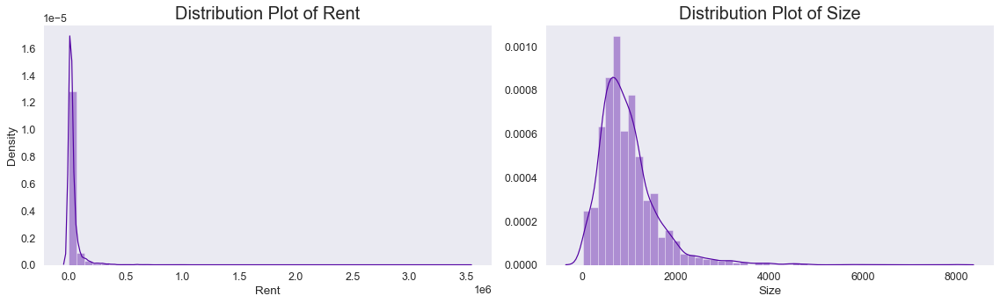

In [10]:
plot_dist_plot()

# INSIGHT

Plot 1. Rent for most of the houses is mostly less than 0.25M. This suggests that owners with higher luxurious houses are not posting listings on the portal.

Plot 2. Most of the houses listed have moderate size of area and more luxurious side of houses are not listed and are rarely present.

In [11]:
def make_box_plot():
    figs = make_subplots(rows = 1, cols = 2, subplot_titles = ["Box Plot of Feature : Rent", "Box Plot of Feature : Size"])
    figs.layout.font.size = 18
    figs.layout.font.family = "Franklin Gothic"
    figs.append_trace(
        go.Box(y = train_dataframe["Rent"].values, name = "Rent"),
        row = 1,
        col = 1
    )
    figs.append_trace(
        go.Box(y = train_dataframe["Size"].values, name = "Size", jitter = 0.5),
        row = 1,
        col = 2
    )
    figs.update_annotations(font_size=24)

    figs.update_layout(
        title=dict(text = "Box Plots for univariate analysis", font = dict(size = 30)),
        height = 600
    )
    figs.iplot()

In [12]:
make_box_plot()

In [13]:
train_dataframe[train_dataframe["Area Locality"] == "Marathahalli"]

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact
2059,2022-06-20,1,18000,550,3 out of 6,Carpet Area,Marathahalli,Bangalore,Semi-Furnished,Bachelors/Family,1,Contact Agent
1837,2022-06-08,3,3500000,2500,4 out of 4,Carpet Area,Marathahalli,Bangalore,Semi-Furnished,Bachelors,3,Contact Agent
1655,2022-07-04,2,32900,1200,3 out of 6,Carpet Area,Marathahalli,Bangalore,Furnished,Bachelors/Family,1,Contact Agent


# insight

Plot 1. There are large number of outliers present in the rent feature which was evident from the fact that the dataset consists of mostly lower priced houses. Due to this the median rent price is less and presence of outliers can be seen from the plot Plot 2. There are large number of outliers present in the size feature as well because most houses are normal sized in the dataset with some ranging in category of luxury homes. Hence many outliers can be seen in the plot.

In plot of Rent feature, we can clearly see there is an outlier present in the training dataset. The price for house in same area locality with half the size is 32900. Hence doubling the area makes no practical logic to 100x the price to 3500000. Therefore, this data point has to be deleted by considering as a special outlier case in order to prevent machine learning model from being confused.

# Count plot


In [14]:
train_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3796 entries, 1995 to 860
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Posted On          3796 non-null   object
 1   BHK                3796 non-null   int64 
 2   Rent               3796 non-null   int64 
 3   Size               3796 non-null   int64 
 4   Floor              3796 non-null   object
 5   Area Type          3796 non-null   object
 6   Area Locality      3796 non-null   object
 7   City               3796 non-null   object
 8   Furnishing Status  3796 non-null   object
 9   Tenant Preferred   3796 non-null   object
 10  Bathroom           3796 non-null   int64 
 11  Point of Contact   3796 non-null   object
dtypes: int64(4), object(8)
memory usage: 385.5+ KB


In [23]:
def make_count_plots():
    figs = make_subplots(rows = 4, cols = 2, subplot_titles = ["Count Plot of Feature : BHK", "Count Plot of Feature : Top 10 Floor", "Count Plot of Feature : Area Type", "Count Plot of Feature : City", "Count Plot of Feature : Furnishing Status", "Count Plot of Feature : Tenant Preferred", "Count Plot of Feature : Bathroom", "Count Plot of Feature : Point of Contact"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["BHK"].value_counts().items()], y = [x[1] for x in  train_dataframe["BHK"].value_counts().items()], name = "BHK", text = [x[1] for x in train_dataframe["BHK"].value_counts().items()], textposition = "outside", ),
        row = 1,
        col = 1
    )
    top_10_floors = [x[0] for x in train_dataframe["Floor"].value_counts()[:10].items()]
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe[(train_dataframe["Floor"].isin(top_10_floors))]["Floor"].value_counts().items()], y = [x[1] for x in train_dataframe[(train_dataframe["Floor"].isin(top_10_floors))]["Floor"].value_counts().items()], name = "Floor", text = [x[1] for x in train_dataframe[(train_dataframe["Floor"].isin(top_10_floors))]["Floor"].value_counts().items()], textposition = "outside"),
        row = 1,
        col = 2
    )

    # Row 2
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["Area Type"].value_counts().items()], y = [x[1] for x in  train_dataframe["Area Type"].value_counts().items()], name = "Area Type", text = [x[1] for x in train_dataframe["Area Type"].value_counts().items()], textposition = "outside"),
        row = 2,
        col = 1
    )
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["City"].value_counts().items()], y = [x[1] for x in  train_dataframe["City"].value_counts().items()], name = "City", text = [x[1] for x in train_dataframe["City"].value_counts().items()], textposition = "outside"),
        row = 2,
        col = 2
    )

    # Row 3
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["Furnishing Status"].value_counts().items()], y = [x[1] for x in  train_dataframe["Furnishing Status"].value_counts().items()], name = "Furnishing Status", text = [x[1] for x in train_dataframe["Furnishing Status"].value_counts().items()], textposition = "outside"),
        row = 3,
        col = 1
    )
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["Tenant Preferred"].value_counts().items()], y = [x[1] for x in  train_dataframe["Tenant Preferred"].value_counts().items()], name = "Tenant Preferred", text = [x[1] for x in train_dataframe["Tenant Preferred"].value_counts().items()], textposition = "outside"),
        row = 3,
        col = 2
    )

    # Row 4

    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["Bathroom"].value_counts().items()], y = [x[1] for x in  train_dataframe["Bathroom"].value_counts().items()], name = "Bathroom", text = [x[1] for x in train_dataframe["Bathroom"].value_counts().items()], textposition = "outside"),
        row = 4,
        col = 1
    )
    figs.append_trace(
        go.Bar(x = [x[0] for x in train_dataframe["Point of Contact"].value_counts().items()], y = [x[1] for x in  train_dataframe["Point of Contact"].value_counts().items()], name = "Point of Contact", text = [x[1] for x in train_dataframe["Point of Contact"].value_counts().items()], textposition = "outside"),
        row = 4,
        col = 2
    )


    figs.update_annotations(font_size=20)
    figs.update_yaxes(range=[0, 2000], row=1, col=1)
    figs.update_yaxes(range=[0, 350], row=1, col=2)
    figs.update_yaxes(range=[0, 2200], row=2, col=1)
    figs.update_yaxes(range=[0, 1000], row=2, col=2)
    figs.update_yaxes(range=[0, 2100], row=3, col=1)
    figs.update_yaxes(range=[0, 3200], row=3, col=2)
    figs.update_yaxes(range=[0, 2100], row=4, col=1)
    figs.update_yaxes(range=[0, 2900], row=4, col=2)
    figs['layout']['xaxis']['title']='BHK'
    figs['layout']['xaxis2']['title']='Floors Type'
    figs['layout']['yaxis']['title']='Count'
    figs['layout']['yaxis2']['title']='Count'

    figs['layout']['xaxis3']['title']='Area Type'
    figs['layout']['xaxis4']['title']='City'
    figs['layout']['yaxis3']['title']='Count'
    figs['layout']['yaxis4']['title']='Count'

    figs['layout']['xaxis5']['title']='Furnishing Status'
    figs['layout']['xaxis6']['title']='Tenant Preferred'
    figs['layout']['yaxis5']['title']='Count'
    figs['layout']['yaxis6']['title']='Count'

    figs['layout']['xaxis7']['title']='Bathroom'
    figs['layout']['xaxis8']['title']='Point of Contact'
    figs['layout']['yaxis7']['title']='Count'
    figs['layout']['yaxis8']['title']='Count'
    figs.update_layout(
        title=dict(text = "Count Plots for univariate analysis", font = dict(size = 30)),
        height = 1500
    )

    figs.iplot()


In [24]:
make_count_plots()

In [25]:
train_dataframe["Floor"].value_counts()

1 out of 2         295
Ground out of 2    278
2 out of 3         256
2 out of 4         247
1 out of 3         235
                  ... 
8 out of 36          1
3 out of 23          1
60 out of 66         1
30 out of 44         1
13 out of 17         1
Name: Floor, Length: 426, dtype: int64

# insight

Plot 1. It is evident from the plot that most of the houses for rent are 2 BHK. There is a huge class imbalance between the classes as houses of 6BHK are barely up for rent.

Plot 2. It would be a researcher bias to make a statement based on this plot as it only contains 10 category of 426 available in the dataset. But looking at the value_counts of the category tells that it is also class imbalanced.

Plot 3. It is evident that most houses are built upon calculation from Super Area or Carpet Area. Built Area is a scarcely category in this case.

Plot 4. The dataset consists of metro cities of India with Kolkata containing almost half as number of instances as present in region with maximum instances.

Plot 5. It can be interpreted that people usally give out a unfurnished or semi furnished house. This could be due to negligience of rented personal to not take care of the owners items. Hence number of fully furnished homes listed are much less as compared to other categories

Plot 6. The owners who list their homes are not biased towards preferred tenant which is usually not the case as most people prefer renting out to families rather than bachelors.

Plot 7. It is evident as the plot is positively skewed. As luxury increases, listings decrease, which was evident from Rent and Size features box plots as well.

Plot 8. Most of the poeple prefer Contact owner as preferred mode of contact. This feature also has imbalance in instances. Contact Builder is so rarely available as usually less number of builders themselves prefer listing houses for rent on such websites.

# Pie Plot

In [27]:
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
matplotlib.rcParams.update(params)
def plot_pie_plot(single_item_dimensions, categorical_variables, categorical_actual_value, nrow, ncol):
    fig, axes = plt.subplots(nrow, ncol, constrained_layout=True, figsize=(single_item_dimensions[0] * ncol, single_item_dimensions[1] * nrow), )
    for i in range(nrow):
        for j in range(ncol):
            x = i
            y = j
            theme = plt.get_cmap('plasma')
            axes[i][j].set_prop_cycle("color", [theme(1. * i / len(train_dataframe[categorical_variables[x * ncol + y]].unique()))
                             for i in range(len(train_dataframe[categorical_variables[x * ncol + y]].unique()))])
            wedges, texts, autotexts = axes[i][j].pie(train_dataframe[categorical_variables[x * ncol + y]].value_counts(), labels=train_dataframe[categorical_variables[x * ncol + y]].unique(), shadow=True, startangle=0, autopct='%1.2f%%', textprops={"color": "white", "alpha": 0, "fontsize": 10})
            if j == 0:
                axes[i][j].legend(loc="right", bbox_to_anchor=[1, 0, 0.5, 1], labels=[f"{x[0].get_text()} {x[1].get_text()}" for x in zip(texts, autotexts)])
            else:
                axes[i][j].legend(loc="right", bbox_to_anchor=[1, 0, 0.7, 1], labels=[f"{x[0].get_text()} {x[1].get_text()}" for x in zip(texts, autotexts)])
            axes[i][j].set_title(f"Pie Plot for {categorical_actual_value[x * ncol + y]}", fontsize=24)

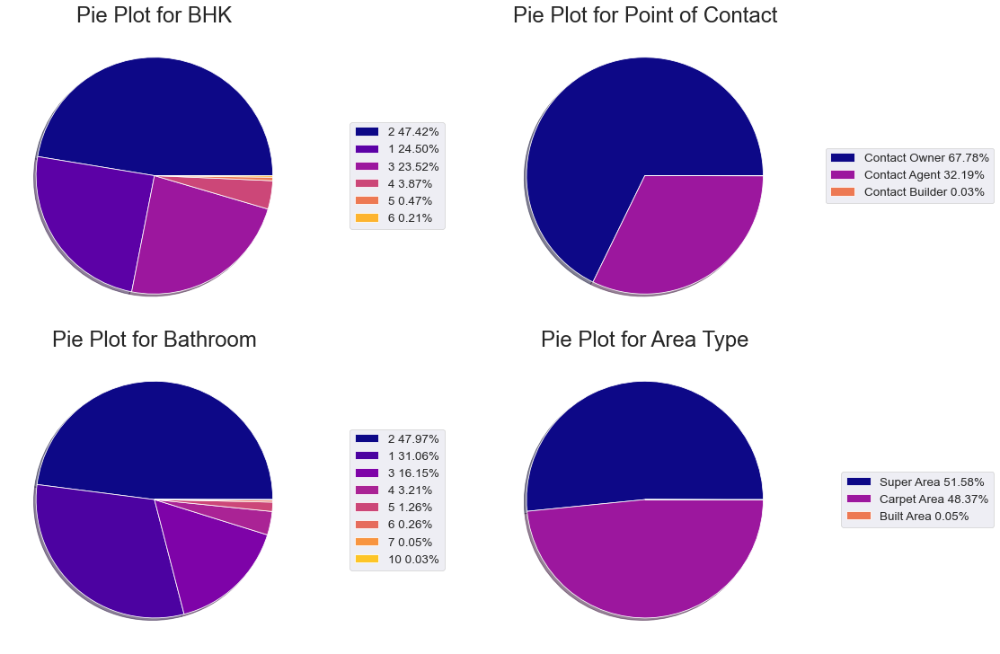

In [28]:
categorical_variables = ["BHK", "Point of Contact", "Bathroom", "Area Type"]
plot_pie_plot(single_item_dimensions = (8, 5), 
                categorical_variables = categorical_variables, 
                categorical_actual_value = ["BHK", "Point of Contact", "Bathroom", "Area Type"], 
                nrow = 2,
                ncol = 2)

In [29]:
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'medium',
         'axes.titlesize':'medium',
         'xtick.labelsize':'medium',
         'ytick.labelsize':'medium'}
matplotlib.rcParams.update(params)
def plot_pie_plot(single_item_dimensions, categorical_variables, categorical_actual_value, nrow, ncol):
    fig, axes = plt.subplots(nrow, ncol, constrained_layout=True, figsize=(single_item_dimensions[0] * ncol, single_item_dimensions[1] * nrow), )
    for i in range(nrow):
        for j in range(ncol):
            x = i
            y = j
            theme = plt.get_cmap('plasma')
            axes[j].set_prop_cycle("color", [theme(1. * i / len(train_dataframe[categorical_variables[x * ncol + y]].unique()))
                             for i in range(len(train_dataframe[categorical_variables[x * ncol + y]].unique()))])
            wedges, texts, autotexts = axes[j].pie(train_dataframe[categorical_variables[x * ncol + y]].value_counts(), labels=train_dataframe[categorical_variables[x * ncol + y]].unique(), shadow=True, startangle=0, autopct='%1.2f%%', textprops={"alpha": 1, "fontsize": 15})
            axes[j].set_title(f"Pie Plot for {categorical_actual_value[x * ncol + y]}", fontsize=24)

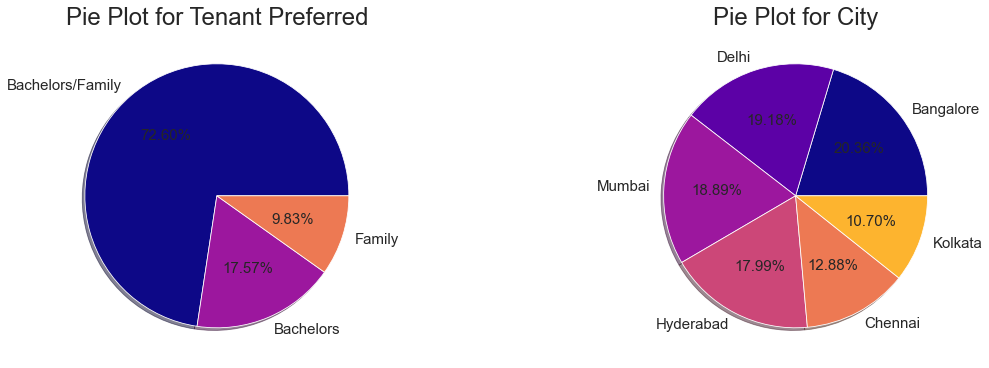

In [30]:
categorical_variables = ["Tenant Preferred", "City"]
plot_pie_plot(single_item_dimensions = (8, 5), 
                categorical_variables = categorical_variables, 
                categorical_actual_value = ["Tenant Preferred", "City"], 
                nrow = 1,
                ncol = 2)

Insights

All Plots: Some of the casegories which were not visually visible in count plots can be seen here along with the percentage of instances they contain compared to the whole dataset. Some of the features are not plotted as a they contain 100 of categories which will not be feasible to show in these plots.

# Bivariate Analysis

# 

# pair plots

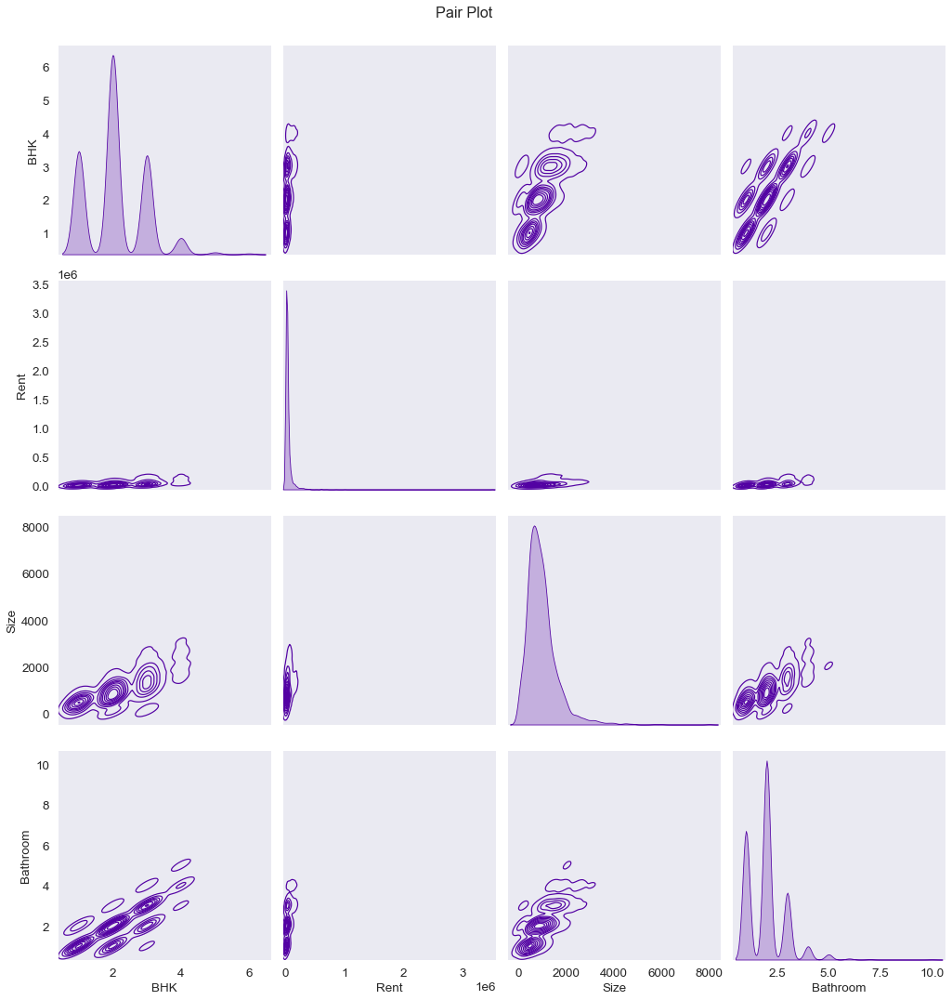

In [35]:
pairplot = sns.pairplot(data=train_dataframe, kind="kde")
pairplot.fig.set_size_inches(15, 15)
pairplot.fig.suptitle("Pair Plot", y=1.02)
plt.show()

In [36]:
train_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3796 entries, 1995 to 860
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Posted On          3796 non-null   object
 1   BHK                3796 non-null   int64 
 2   Rent               3796 non-null   int64 
 3   Size               3796 non-null   int64 
 4   Floor              3796 non-null   object
 5   Area Type          3796 non-null   object
 6   Area Locality      3796 non-null   object
 7   City               3796 non-null   object
 8   Furnishing Status  3796 non-null   object
 9   Tenant Preferred   3796 non-null   object
 10  Bathroom           3796 non-null   int64 
 11  Point of Contact   3796 non-null   object
dtypes: int64(4), object(8)
memory usage: 514.6+ KB


# Box Plot

In [37]:
def make_box_plot_2():
    figs = make_subplots(rows = 3, cols = 2, subplot_titles = ["Box Plot of BHK vs Rent", "Box Plot of BHK vs Size", "Box Plot of Area Type vs Rent", "Box Plot of Area Type vs Size", "Box Plot of City vs Rent", "Box Plot of City vs Size"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Box(x = train_dataframe["BHK"].values, y=train_dataframe["Rent"].values, name = "BHK vs Rent", boxmean="sd"),
        row = 1,
        col = 1
    )

    figs.append_trace(
        go.Box(x = train_dataframe["BHK"].values, y=train_dataframe["Size"].values, name = "BHK vs Size", boxmean="sd"),
        row = 1,
        col = 2
    )
     #Row 2
    figs.append_trace(
        go.Box(x = train_dataframe["Area Type"].values, y=train_dataframe["Rent"].values, name = "Area Type vs Rent", boxmean="sd"),
        row = 2,
        col = 1
    )

    figs.append_trace(
        go.Box(x = train_dataframe["Area Type"].values, y=train_dataframe["Size"].values, name = "Area Type vs Size", boxmean="sd"),
        row = 2,
        col = 2
    )

    #Row 3
    figs.append_trace(
        go.Box(x = train_dataframe["City"].values, y=train_dataframe["Rent"].values, name = "City vs Rent", boxmean="sd"),
        row = 3,
        col = 1
    )
    figs.append_trace(
        go.Box(x = train_dataframe["City"].values, y=train_dataframe["Size"].values, name = "City vs Size", boxmean="sd"),
        row = 3,
        col = 2
    )
    figs['layout']['xaxis']['title']='BHK'
    figs['layout']['xaxis2']['title']='BHK'
    figs['layout']['yaxis']['title']='Rent'
    figs['layout']['yaxis2']['title']='Size'

    figs['layout']['xaxis3']['title']='Area Type'
    figs['layout']['xaxis4']['title']='Area Type'
    figs['layout']['yaxis3']['title']='Rent'
    figs['layout']['yaxis4']['title']='Size'

    figs['layout']['xaxis5']['title']='City'
    figs['layout']['xaxis6']['title']='City'
    figs['layout']['yaxis5']['title']='Rent'
    figs['layout']['yaxis6']['title']='Size'
    figs.update_annotations(font_size=20)
    figs.update_layout(
        title=dict(text = "Box Plots for bivariate analysis", font = dict(size = 30)),
        height = 1500
    )
    figs.iplot()

In [39]:
make_box_plot_2()

Insights

Plot 1. It can be noticed from BHK vs Rent plot that the quantiles of houses of 3BHK and 6BHK are almost equal. Thereby hinting that the prices might be similar even due to increase in number of rooms which can be a steal for some if this was considered.

Plot 2. In BHK vs Size plot, as expected, the size of the house increases as BHK number increases.

Plot 3. In Area Type vs Rent plot, Carpet Area category has higher standard deviation as compared to Super Area. Also the median rent prices for house with Carpet Area type is greater than rent prices for house with Super Area.

Plot 4. In Area Type vs Size plot, the size for Carpet Area Category and Super Area Category are almost identical in terms of statistical properties. Due to presence of less instaces in Built Area type, there are no outliers as in other categories.

Plot 5. In Cities vs Rent plot, it can be seen that Mumbai has the highest median house price, then followed by Delhi. It can be validated by the fact that Mumbai is considered as financial capital of India, whereas Delhi is the capital of India. Bangalore has a higher standard deviation due to huge outlier present.

Plot 6. In Cities vs Size plot, the median sizes for houses in Hyderabad, Bangalore, Chennai are higher. The validation of this trend can be noticed by the fact that area size for Delhi and Mumbai is less.

In [40]:
def make_box_plot_3():
    figs = make_subplots(rows = 4, cols = 2, subplot_titles = ["Box Plot of Furnishing Status vs Rent", "Box Plot of Furnishing Status vs Size", "Box Plot of Tenant Preferred vs Rent", "Box Plot of Tenant Preferred vs Size", "Box Plot of Bathroom vs Rent", "Box Plot of Bathroom vs Size", "Box Plot of Point of Contact vs Rent", "Box Plot of Point of Contact vs Size"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Box(x = train_dataframe["Furnishing Status"].values, y=train_dataframe["Rent"].values, name = "Furnishing Status vs Rent", boxmean="sd"),
        row = 1,
        col = 1
    )
    

    figs.append_trace(
        go.Box(x = train_dataframe["Furnishing Status"].values, y=train_dataframe["Size"].values, name = "Furnishing Status vs Size", boxmean="sd"),
        row = 1,
        col = 2
    )
    #Row 2
    figs.append_trace(
        go.Box(x = train_dataframe["Tenant Preferred"].values, y=train_dataframe["Rent"].values, name = "Tenant Preferred vs Rent", boxmean="sd"),
        row = 2,
        col = 1
    )

    figs.append_trace(
        go.Box(x = train_dataframe["Tenant Preferred"].values, y=train_dataframe["Size"].values, name = "Tenant Preferred vs Size", boxmean="sd"),
        row = 2,
        col = 2
    )
    #Row 3
    figs.append_trace(
        go.Box(x = train_dataframe["Bathroom"].values, y=train_dataframe["Rent"].values, name = "Bathroom vs Rent", boxmean="sd"),
        row = 3,
        col = 1
    )

    figs.append_trace(
        go.Box(x = train_dataframe["Bathroom"].values, y=train_dataframe["Size"].values, name = "Bathroom vs Size", boxmean="sd"),
        row = 3,
        col = 2
    )
     #Row 4
    figs.append_trace(
        go.Box(x = train_dataframe["Point of Contact"].values, y=train_dataframe["Rent"].values, name = "Point of Contact vs Rent", boxmean="sd"),
        row = 4,
        col = 1
    )

    figs.append_trace(
        go.Box(x = train_dataframe["Point of Contact"].values, y=train_dataframe["Size"].values, name = "Point of Contact vs Size", boxmean="sd"),
        row = 4,
        col = 2
    )
    figs['layout']['xaxis']['title']='Furnishing Status'
    figs['layout']['xaxis2']['title']='Furnishing Status'
    figs['layout']['yaxis']['title']='Rent'
    figs['layout']['yaxis2']['title']='Size'

    figs['layout']['xaxis3']['title']='Tenant Preferred'
    figs['layout']['xaxis4']['title']='Tenant Preferred'
    figs['layout']['yaxis3']['title']='Rent'
    figs['layout']['yaxis4']['title']='Size'

    figs['layout']['xaxis5']['title']='Bathroom'
    figs['layout']['xaxis6']['title']='Bathroom'
    figs['layout']['yaxis5']['title']='Rent'
    figs['layout']['yaxis6']['title']='Size'

    figs['layout']['xaxis7']['title']='Person of Contact'
    figs['layout']['xaxis8']['title']='Person of Contact'
    figs['layout']['yaxis7']['title']='Rent'
    figs['layout']['yaxis8']['title']='Size'
    figs.update_annotations(font_size=20)
    figs.update_layout(
        title=dict(text = "Box Plots for bivariate analysis", font = dict(size = 30)),
        height = 1800
    )
    figs.iplot()

In [41]:
make_box_plot_3()

In [42]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4746 entries, 0 to 4745
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Posted On          4746 non-null   object
 1   BHK                4746 non-null   int64 
 2   Rent               4746 non-null   int64 
 3   Size               4746 non-null   int64 
 4   Floor              4746 non-null   object
 5   Area Type          4746 non-null   object
 6   Area Locality      4746 non-null   object
 7   City               4746 non-null   object
 8   Furnishing Status  4746 non-null   object
 9   Tenant Preferred   4746 non-null   object
 10  Bathroom           4746 non-null   int64 
 11  Point of Contact   4746 non-null   object
dtypes: int64(4), object(8)
memory usage: 445.1+ KB


Insights

Plot 1. In Furnishing Type vs Rent plot, rent prices for Semi Furnished houses has a higher standard deviation, hinting that semi furnished houses are are present in both mid and lower price ranges.

Plot 2. In Furnishing Type vs Size plot, size for both Semi furnished and furnished are usually similar with high outliers present in Semi furnished category.

Plot 3. In Tenant Type vs Rent plot, the standard deviation of rent prices for only bachelors is higher hinting that charges are a bit more which is usually acceptable.

Plot 4. In Tenant Type vs Size plot, it is can be interpreted that median house size in decreses order are just Family, just Bachelors and then Family/Bachelors. This hypothesis can be confirmed by the fact that just families usually have a high member count usually and hence require a larger house.

Plot 5. In Bathroom vs Rent plot, a weird trend can be observed that if first median rent increases with increase in number of bathroom then decresases.

Plot 6. In Bathroom vs Size plot, an evident trend can be observed that increase in number of bathroom increases size of the house.

Plot 7. In Point of Contact vs Rent Prices plot, it can be seen that the median house price for contacting with Agent is almost three times as that of contacting with owner. This can be explained by the fact that Agents usually take commission.
Plot 8. In Point of Contact vs Size plot, it can be seen that in lower priced houses, it is preferred to contact owner rather than agent as owner want to prevent agent from taking commission.

# VIOLIN PLOT

In [43]:
def make_violin_plot():
    figs = make_subplots(rows = 3, cols = 2, subplot_titles = ["Violin Plot of BHK vs Rent", "Violin Plot of BHK vs Size", "Violin Plot of Area Type vs Rent", "Violin Plot of Area Type vs Size", "Violin Plot of City vs Rent", "Violin Plot of City vs Size"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Violin(x = train_dataframe["BHK"].values, y=train_dataframe["Rent"].values, name = "BHK vs Rent"),
        row = 1,
        col = 1
    )

    figs.append_trace(
        go.Violin(x = train_dataframe["BHK"].values, y=train_dataframe["Size"].values, name = "BHK vs Size"),
        row = 1,
        col = 2
        )

    #Row 2
    figs.append_trace(
        go.Violin(x = train_dataframe["Area Type"].values, y=train_dataframe["Rent"].values, name = "Area Type vs Rent"),
        row = 2,
        col = 1
    )

    figs.append_trace(
        go.Violin(x = train_dataframe["Area Type"].values, y=train_dataframe["Size"].values, name = "Area Type vs Size"),
        row = 2,
        col = 2
    )
    #Row 3
    figs.append_trace(
        go.Violin(x = train_dataframe["City"].values, y=train_dataframe["Rent"].values, name = "City vs Rent"),
        row = 3,
        col = 1
    )

    figs.append_trace(
        go.Violin(x = train_dataframe["City"].values, y=train_dataframe["Size"].values, name = "City vs Size"),
        row = 3,
        col = 2
    )
    figs['layout']['xaxis']['title']='BHK'
    figs['layout']['xaxis2']['title']='BHK'
    figs['layout']['yaxis']['title']='Rent'
    figs['layout']['yaxis2']['title']='Size'

    figs['layout']['xaxis3']['title']='Area Type'
    figs['layout']['xaxis4']['title']='Area Type'
    figs['layout']['yaxis3']['title']='Rent'
    figs['layout']['yaxis4']['title']='Size'

    figs['layout']['xaxis5']['title']='City'
    figs['layout']['xaxis6']['title']='City'
    figs['layout']['yaxis5']['title']='Rent'
    figs['layout']['yaxis6']['title']='Size'

    figs.update_annotations(font_size=20)
    figs.update_layout(
        title=dict(text = "Violin Plots for bivariate analysis", font = dict(size = 30)),
        height = 1500
    )
    figs.iplot()

In [44]:
make_violin_plot()

Insights

Plot 1. In plot of BHK vs Rent, it is clear that most of the distribution of 1BHK houses is with a rent of less than 50k, 2BHK doubling to 100k, 3BHK to around 170k and in a similar fashion increasing. When reaches 6BHK the distribution range of value decreases.

Plot 2. In plot of BHK vs Size, as expected, as BHK value increases size also increases.

Plot 3. In plot of Area Type vs Rent, Carpet Area has a higher rent distribution whereas Super Area has maximum distribution along low rent ranges.

Plot 4. In plot of Area Type vs Size, both Super Area and Carpet Area have max distribution laying from size range 0 - 1000.

Plot 5. In plot of City vs Rent, most cities have distribution spread around ranges from 0 - 50k. One important thing to be noted here is, financial capital of India has evenly spread distribution in range of 0 - 120k, thereby maximum in all the cities.

Plot 6. In plot of City vs Size, most of the cities have a evenly spread distribution on ranges 0 - 2000.

In [45]:
def make_violin_plot_2():
    figs = make_subplots(rows = 4, cols = 2, subplot_titles = ["Violin Plot of Furnishing Status vs Rent", "Violin Plot of Furnishing Status vs Size", "Violin Plot of Tenant Preferred vs Rent", "Violin Plot of Tenant Preferred vs Size", "Violin Plot of Bathroom vs Rent", "Violin Plot of Bathroom vs Size", "Violin Plot of Point of Contact vs Rent", "Violin Plot of Point of Contact vs Size"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Violin(x = train_dataframe["Furnishing Status"].values, y=train_dataframe["Rent"].values, name = "Furnishing Status vs Rent"),
        row = 1,
        col = 1
    )
    figs.append_trace(
        go.Violin(x = train_dataframe["Furnishing Status"].values, y=train_dataframe["Size"].values, name = "Furnishing Status vs Size"),
        row = 1,
        col = 2
    )

    #Row 2
    figs.append_trace(
        go.Violin(x = train_dataframe["Tenant Preferred"].values, y=train_dataframe["Rent"].values, name = "Tenant Preferred vs Rent"),
        row = 2,
        col = 1
    )

    figs.append_trace(
        go.Violin(x = train_dataframe["Tenant Preferred"].values, y=train_dataframe["Size"].values, name = "Tenant Preferred vs Size"),
        row = 2,
        col = 2
    )
    #Row 3
    figs.append_trace(
        go.Violin(x = train_dataframe["Bathroom"].values, y=train_dataframe["Rent"].values, name = "Bathroom vs Rent"),
        row = 3,
        col = 1
    )

    figs.append_trace(
        go.Violin(x = train_dataframe["Bathroom"].values, y=train_dataframe["Size"].values, name = "Bathroom vs Size"),
        row = 3,
        col = 2
    )

    #Row 4
    figs.append_trace(
        go.Violin(x = train_dataframe["Point of Contact"].values, y=train_dataframe["Rent"].values, name = "Point of Contact vs Rent"),
        row = 4,
        col = 1
    )
    figs.append_trace(
        go.Violin(x = train_dataframe["Point of Contact"].values, y=train_dataframe["Size"].values, name = "Point of Contact vs Size"),
        row = 4,
        col = 2
    )

    figs['layout']['xaxis']['title']='Furnishing Status'
    figs['layout']['xaxis2']['title']='Furnishing Status'
    figs['layout']['yaxis']['title']='Rent'
    figs['layout']['yaxis2']['title']='Size'

    figs['layout']['xaxis3']['title']='Tenant Preferred'
    figs['layout']['xaxis4']['title']='Tenant Preferred'
    figs['layout']['yaxis3']['title']='Rent'
    figs['layout']['yaxis4']['title']='Size'

    figs['layout']['xaxis5']['title']='Bathroom'
    figs['layout']['xaxis6']['title']='Bathroom'
    figs['layout']['yaxis5']['title']='Rent'
    figs['layout']['yaxis6']['title']='Size'
    figs['layout']['xaxis7']['title']='Person of Contact'
    figs['layout']['xaxis8']['title']='Person of Contact'
    figs['layout']['yaxis7']['title']='Rent'
    figs['layout']['yaxis8']['title']='Size'

    figs.update_annotations(font_size=20)
    figs.update_layout(
        title=dict(text = "Violin Plots for bivariate analysis", font = dict(size = 30)),
        height = 1800
    )
    figs.iplot()

In [46]:
make_violin_plot_2()

Insights

Plot 1. In plot of Furnishing Type vs Rent, the rent of most furnishing category ranges from 0 - 80k (mostly spread around this range).

Plot 2. In plot of Furnishing Type vs Size, for all the categories, the distribution of size first increases, reaches a maximum and then decreases.

Plot 3. In plot of Preferred Tenant vs Rent, for all the categories, the distribution first increases, reaches a max point and then decreases.

Plot 4. In plot of Preferred Tenant vs Size, for all the categories, the distribution first increases, reaches a max point and then decreases. (range from 0 - 2000)

Plot 5. In plot of Bathroom vs Rent, as expected, the distribution max point increases as number of bathroom increases.

Plot 6. In plot of Bathroom vs Size, as expected, the distribution max point increases as number of bathroom increases.

Plot 7. In plot of Contact Person vs Rent, as we can visualize the max distribution price of agent contact is higher than max distribution price of owner contact.

Plot 8. In plot of Contact Person vs Size, the maximum distribution point i.e. the size of house at which max distribution of category is, increases from Contact Owner to Contact Agent.
This can also conclude that owners prefer contacting renters themselves rather than connecting with agents.

# BAR PLOT

In [47]:
def make_bar_plot():
    figs = make_subplots(rows = 3, cols = 2, subplot_titles = ["Bar Plot of BHK vs Rent", "Bar Plot of BHK vs Size", "Bar Plot of Area Type vs Rent", "Bar Plot of Area Type vs Size", "Bar Plot of City vs Rent", "Bar Plot of City vs Size"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Bar(x = train_dataframe["BHK"].values, y=train_dataframe["Rent"].values, name = "BHK vs Rent"),
        row = 1,
        col = 1
    )

    figs.append_trace(
        go.Bar(x = train_dataframe["BHK"].values, y=train_dataframe["Size"].values, name = "BHK vs Size"),
        row = 1,
        col = 2
    )
    #Row 2
    figs.append_trace(
        go.Bar(x = train_dataframe["Area Type"].values, y=train_dataframe["Rent"].values, name = "Area Type vs Rent"),
        row = 2,
        col = 1
    )

    figs.append_trace(
        go.Bar(x = train_dataframe["Area Type"].values, y=train_dataframe["Size"].values, name = "Area Type vs Size"),
        row = 2,
        col = 2
    )
    #Row 3
    figs.append_trace(
        go.Bar(x = train_dataframe["City"].values, y=train_dataframe["Rent"].values, name = "City vs Rent"),
        row = 3,
        col = 1
    )

    figs.append_trace(
        go.Bar(x = train_dataframe["City"].values, y=train_dataframe["Size"].values, name = "City vs Size"),
        row = 3,
        col = 2
    )
    figs['layout']['xaxis']['title']='BHK'
    figs['layout']['xaxis2']['title']='BHK'
    figs['layout']['yaxis']['title']='Rent'
    figs['layout']['yaxis2']['title']='Size'

    figs['layout']['xaxis3']['title']='Area Type'
    figs['layout']['xaxis4']['title']='Area Type'
    figs['layout']['yaxis3']['title']='Rent'
    figs['layout']['yaxis4']['title']='Size'

    figs['layout']['xaxis5']['title']='City'
    figs['layout']['xaxis6']['title']='City'
    figs['layout']['yaxis5']['title']='Rent'
    figs['layout']['yaxis6']['title']='Size'

    figs.update_annotations(font_size=20)
    figs.update_layout(
        title=dict(text = "Bar Plots for bivariate analysis", font = dict(size = 30)),
        height = 1500
    )
    figs.iplot()

In [48]:
make_bar_plot()

In [49]:
def make_bar_plot_2():
    figs = make_subplots(rows = 4, cols = 2, subplot_titles = ["Bar Plot of Furnishing Status vs Rent", "Bar Plot of Furnishing Status vs Size", "Bar Plot of Tenant Preferred vs Rent", "Bar Plot of Tenant Preferred vs Size", "Bar Plot of Bathroom vs Rent", "Bar Plot of Bathroom vs Size", "Bar Plot of Point of Contact vs Rent", "Bar Plot of Point of Contact vs Size"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Bar(x = train_dataframe["Furnishing Status"].values, y=train_dataframe["Rent"].values, name = "Furnishing Status vs Rent"),
        row = 1,
        col = 1
    )
    figs.append_trace(
        go.Bar(x = train_dataframe["Furnishing Status"].values, y=train_dataframe["Size"].values, name = "Furnishing Status vs Size"),
        row = 1,
        col = 2
    )

    #Row 2
    figs.append_trace(
        go.Bar(x = train_dataframe["Tenant Preferred"].values, y=train_dataframe["Rent"].values, name = "Tenant Preferred vs Rent"),
        row = 2,
        col = 1
    )
    figs.append_trace(
        go.Bar(x = train_dataframe["Tenant Preferred"].values, y=train_dataframe["Size"].values, name = "Tenant Preferred vs Size"),
        row = 2,
        col = 2
    )

    #Row 3
    figs.append_trace(
        go.Bar(x = train_dataframe["Bathroom"].values, y=train_dataframe["Rent"].values, name = "Bathroom vs Rent"),
        row = 3,
        col = 1
    )

    figs.append_trace(
        go.Bar(x = train_dataframe["Bathroom"].values, y=train_dataframe["Size"].values, name = "Bathroom vs Size"),
        row = 3,
        col = 2
    )
    #Row 4
    figs.append_trace(
        go.Bar(x = train_dataframe["Point of Contact"].values, y=train_dataframe["Rent"].values, name = "Point of Contact vs Rent"),
        row = 4,
        col = 1
    )

    figs.append_trace(
        go.Bar(x = train_dataframe["Point of Contact"].values, y=train_dataframe["Size"].values, name = "Point of Contact vs Size"),
        row = 4,
        col = 2
    )

    figs['layout']['xaxis']['title']='Furnishing Status'
    figs['layout']['xaxis2']['title']='Furnishing Status'
    figs['layout']['yaxis']['title']='Rent'
    figs['layout']['yaxis2']['title']='Size'

    figs['layout']['xaxis3']['title']='Tenant Preferred'
    figs['layout']['xaxis4']['title']='Tenant Preferred'
    figs['layout']['yaxis3']['title']='Rent'
    figs['layout']['yaxis4']['title']='Size'

    figs['layout']['xaxis5']['title']='Bathroom'
    figs['layout']['xaxis6']['title']='Bathroom'
    figs['layout']['yaxis5']['title']='Rent'
    figs['layout']['yaxis6']['title']='Size'

    figs['layout']['xaxis7']['title']='Person of Contact'
    figs['layout']['xaxis8']['title']='Person of Contact'
    figs['layout']['yaxis7']['title']='Rent'
    figs['layout']['yaxis8']['title']='Size'


    figs.update_annotations(font_size=20)
    figs.update_layout(
        title=dict(text = "Bar Plots for bivariate analysis", font = dict(size = 30)),
        height = 1800
    )
    figs.iplot()

In [50]:
make_bar_plot_2()

# MULTIVARIATE ANALYSIS

# 

#scatter plot

In [51]:
def make_scatter():
    figs = make_subplots(rows = 1, cols = 2, subplot_titles = ["Scatter Plot of Size vs Rent and BHK", "Scatter Plot of Size vs Rent and Bathroom"],  vertical_spacing = 0.1)
    figs.layout.font.size = 15
    figs.layout.font.family = "Franklin Gothic"
    # Row 1
    figs.append_trace(
        go.Scatter(x = train_dataframe["BHK"].values, y=train_dataframe["Size"].values, name = "Size vs Rent and BHK", mode="markers", marker_color=train_dataframe["BHK"], marker_size = train_dataframe["Rent"] / 20000),
        row = 1,
        col = 1
    )
    figs.append_trace(
        go.Scatter(x = train_dataframe["Bathroom"].values, y=train_dataframe["Size"].values, name = "Size vs Rent and BHK", mode="markers", marker_color=train_dataframe["BHK"], marker_size = train_dataframe["Rent"] / 20000),
        row = 1,
        col = 2
    )

    figs.update_annotations(font_size=20)
    figs.update_layout(legend= {'itemsizing': 'trace'})
    figs.update_layout(
        showlegend=False,
        title=dict(text = "Scatter Plots for multivariate analysis", font = dict(size = 30)),
        height = 500
    )
    figs.iplot()

In [52]:
make_scatter()

# GEOGRAPHICAL ANALYSIS

# 

Chleoropath Plot

In [53]:
train_dataframe["State"] = ["" for _ in range(len(train_dataframe))]
train_dataframe.loc[train_dataframe["City"] == "Delhi", "State"] = "Delhi"
train_dataframe.loc[train_dataframe["City"] == "Mumbai", "State"] = "Maharashtra"
train_dataframe.loc[train_dataframe["City"] == "Bangalore", "State"] = "Karnataka"
train_dataframe.loc[train_dataframe["City"] == "Hyderabad", "State"] = "Telangana"
train_dataframe.loc[train_dataframe["City"] == "Chennai", "State"] = "Tamil Nadu"
train_dataframe.loc[train_dataframe["City"] == "Kolkata", "State"] = "West Bengal"

As there are no two similar States after looking at City variable, we have added a new State feature consisting of cities in which they are present in order to visualize better on choropleth plot. Cities would be very small to visualize.

Median value comparison of Rent of different regions


In [54]:
def make_map_plot():
    with urlopen("https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson") as response:
        india = json.load(response)
    test = train_dataframe.groupby("State")["Rent"].describe()
    test["state"] = test.index
    fig = px.choropleth_mapbox(test, geojson=india, color="50%",
                               locations="state", featureidkey="properties.ST_NM",
                               center={"lat": 23.5120, "lon": 80.3290},
                               mapbox_style="open-street-map", 
                               zoom = 3.2)
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.update_geos(fitbounds="locations", visible=False)
    fig.show()

In [55]:
make_map_plot()

Median value comparism of size of different regions

In [56]:
def make_map_2():
    with urlopen("https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson") as response:
        india = json.load(response)
    test = train_dataframe.groupby("State")["Size"].describe()
    test["state"] = test.index
    fig = px.choropleth_mapbox(test, geojson=india, color="50%",
                               locations="state", featureidkey="properties.ST_NM",
                               center={"lat": 23.5120, "lon": 80.3290},
                               mapbox_style="open-street-map", 
                               zoom = 3.2)
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.update_geos(fitbounds="locations", visible=False)
    fig.show()

In [57]:
make_map_2()

# CONCLUSION


After performing Exploratory Data Analysis on this dataset, I have come to following hypothesis:

As the rent for most of the houses is mostly less than 0.25M, hence listings of luxurious houses are rarely posted on the platform.

Rent Feature is distributed just like salary in corporate, mostly taking average salaries and executive salaries are taken by just some.

The rent for a 6BHK is comparitive to a 3BHK. This could potentially help in getting a great deal from the owner of these 6BHK homes.

The dataset is based on metro cities where rents are usually high as compared to types of cities which have less level of facilities.

The owners of these listings are not biased towards tenant preferred but just bachelors usually have to pay higher rent as compared to owners who accept only families or both families and bachelors.

For low priced houses, contacting the owners is preferred mode of contact as it helps them in having comission.
 Very few listings are where builder have to be contacted as rarely builders will be directly renting houses.

The dataset had high class imbalance for most of the categories.

Medium rent increases first with increase in number of bathrooms in the house and then decreses. This could help in identify houses that are large as they contain large number of bathrooms as well as have less rent.

# Feature Engineering

In Floor feature, we have a lot of unique values. So we will be dividing it into two features. These two features will be Rent Floor and Total Floor in the building. This can be done by finding " out of " pattern in the Floor string. But in some cases, this " out of string " is not present.

The values present in this case are ("1" -> 2 instances, "3" -> 1 instance, "Ground" -> One instance). In total these are just 4 instances and we can safely remove them to make our training set more accurate and error free.

Lets Drop the Area Locality feature as we wont be using it.

In the following dataset we have to One Hot encode the following columns:

    Area Type
    City
    Furnishing Status
    Tenant Preferred
    Point of Contact
    
If we convert it into categorical categories only then the machine learning model might find correlation among categories which are close to each other even when they are not correlated.

In [58]:
def prepare_training_set(train_dataframe):
    train_dataframe.drop(train_dataframe[train_dataframe["Floor"] == "3"].index, axis = 0, inplace=True)
    train_dataframe.drop(train_dataframe[train_dataframe["Floor"] == "1"].index, axis = 0, inplace=True)
    train_dataframe.drop(train_dataframe[train_dataframe["Floor"] == "Ground"].index, axis = 0, inplace=True)
    train_dataframe["Renting Floor"] = [x.split(" out of ")[0] for x in train_dataframe["Floor"].values]
    train_dataframe["Total Floor"] = [x.split(" out of ")[1] for x in train_dataframe["Floor"].values]
    train_dataframe.loc[train_dataframe["Renting Floor"] == "Ground", "Renting Floor"] = "0"
    train_dataframe.loc[train_dataframe["Renting Floor"] == "Upper Basement", "Renting Floor"]= "-1"
    train_dataframe.loc[train_dataframe["Renting Floor"] == "Lower Basement", "Renting Floor"] = "-2"
    train_dataframe["Renting Floor"] = train_dataframe["Renting Floor"].astype(int)
    train_dataframe["Total Floor"] = train_dataframe["Total Floor"].astype(int)
    train_dataframe.drop(axis = 1, labels="Floor", inplace=True)
    train_dataframe["Posted Month"] = [x.split("-")[1] for x in train_dataframe["Posted On"].values]
    train_dataframe["Posted Date"] = [x.split("-")[2] for x in train_dataframe["Posted On"].values]
    train_dataframe["Posted Month"] = train_dataframe["Posted Month"].astype(int)
    train_dataframe["Posted Date"] = train_dataframe["Posted Date"].astype(int)
    train_dataframe.drop(axis = 1, labels="Posted On", inplace=True)
    train_dataframe.drop(axis = 1, labels = "Area Locality", inplace = True)
    X = train_dataframe.loc[:, ['BHK', 'Size', 'Area Type', 'City', 'Furnishing Status',
       'Tenant Preferred', 'Bathroom', 'Point of Contact', 'Renting Floor',
       'Total Floor', 'Posted Month', 'Posted Date']]
    Y = train_dataframe.loc[:, ["Rent"]]
    return X, Y

In [59]:
def prepare_test_set(testdataframe):
    test_dataframe.drop(test_dataframe[test_dataframe["Floor"] == "3"].index, axis = 0, inplace=True)
    test_dataframe.drop(test_dataframe[test_dataframe["Floor"] == "1"].index, axis = 0, inplace=True)
    test_dataframe.drop(test_dataframe[test_dataframe["Floor"] == "Ground"].index, axis = 0, inplace=True)
    test_dataframe["Renting Floor"] = [x.split(" out of ")[0] for x in test_dataframe["Floor"].values]
    test_dataframe["Total Floor"] = [x.split(" out of ")[1] for x in test_dataframe["Floor"].values]
    test_dataframe.loc[test_dataframe["Renting Floor"] == "Ground", "Renting Floor"] = "0"
    test_dataframe.loc[test_dataframe["Renting Floor"] == "Upper Basement", "Renting Floor"]= "-1"
    test_dataframe.loc[test_dataframe["Renting Floor"] == "Lower Basement", "Renting Floor"] = "-2"
    test_dataframe["Renting Floor"] = test_dataframe["Renting Floor"].astype(int)
    test_dataframe["Total Floor"] = test_dataframe["Total Floor"].astype(int)
    test_dataframe.drop(axis = 1, labels="Floor", inplace=True)
    test_dataframe["Posted Month"] = [x.split("-")[1] for x in test_dataframe["Posted On"].values]
    test_dataframe["Posted Date"] = [x.split("-")[2] for x in test_dataframe["Posted On"].values]
    test_dataframe["Posted Month"] = test_dataframe["Posted Month"].astype(int)
    test_dataframe["Posted Date"] = test_dataframe["Posted Date"].astype(int)
    test_dataframe.drop(axis = 1, labels="Posted On", inplace=True)
    test_dataframe.drop(axis = 1, labels = "Area Locality", inplace = True)
    X_test = test_dataframe.loc[:, ['BHK', 'Size', 'Area Type', 'City', 'Furnishing Status',
           'Tenant Preferred', 'Bathroom', 'Point of Contact', 'Renting Floor',
           'Total Floor', 'Posted Month', 'Posted Date']]
    Y_test = test_dataframe.loc[:, ["Rent"]]
    return X_test, Y_test

In [60]:
columntrans = ColumnTransformer(transformers=[
    ("cat", OneHotEncoder(sparse=False), ["Area Type", "City", "Furnishing Status", "Tenant Preferred", "Point of Contact"]),
    ("scaler", StandardScaler(), ["Size"])
], remainder="passthrough")
X, Y = prepare_training_set(train_dataframe)
X_test, Y_test = prepare_test_set(test_dataframe)
X = columntrans.fit_transform(X)
X_test = columntrans.transform(X_test)
Y = Y.values
Y_test = Y_test.values

# Modelling

In [61]:
models = [
    LinearRegression(),
    Ridge(),
    Lasso(),
    ElasticNet(alpha = 0.5),
    SVR(kernel="poly"),
    LinearSVR(),
    DecisionTreeRegressor(max_depth=4),
    RandomForestRegressor(n_estimators = 100, max_depth = 4),
    AdaBoostRegressor(),
    XGBRegressor()
]
training_rmse = []
for model in models:
    print(f"Starting Training of model: {model.__class__.__name__}")
    model.fit(X, Y)
    training_rmse.append(np.sqrt(mean_squared_error(Y, model.predict(X))))

Starting Training of model: LinearRegression
Starting Training of model: Ridge
Starting Training of model: Lasso
Starting Training of model: ElasticNet
Starting Training of model: SVR
Starting Training of model: LinearSVR
Starting Training of model: DecisionTreeRegressor
Starting Training of model: RandomForestRegressor
Starting Training of model: AdaBoostRegressor
Starting Training of model: XGBRegressor


# Evaluation

In [62]:
testing_rmse = []
for model in models:
    testing_rmse.append(np.sqrt(mean_squared_error(Y_test, model.predict(X_test))))

In [63]:
fig = px.bar(x = [x.__class__.__name__ for x in models], y = training_rmse, title="Training RMSE (lower is better)")
fig

In [64]:
fig = px.bar(x = [x.__class__.__name__ for x in models], y = testing_rmse, title="Testing RMSE (lower is better)")
fig

Modelling Observations
XGBRegressor is serverly overfitting the training set results in a bad generalization

SVM neither with polynomial kernel nor with rbf kernel able to detect the difference between irregularities.

AdaBoost regressor as well as Random Forest Regressor are also overfitting the training set.

Linear SVM outperforms nonlinear svm, hinting the decision boundary is somewhat linear in nature. This can be evident from the fact the linear regression also performs well as compared to other non linear models.

As most of the models are overfitting, a solution for this could be to increase the dataset as we have seen we have had no improvement inspite of increasing the model complexity.

Incase you liked my work, make sure to upvote this notebook as well as checkout my other work on the platform. Thank you for your time.